## **Project 1-Final Report**
-Darshit Doshi and Jared Kohler

#### We downloaded the Data from SafeGraph https://shop.safegraph.com/ with a coupon code aimed at data science students. 
***About Safegraph:*** "We obtain a variety of information (collectively the “Information”) from trusted third-party data partners such as mobile application developers. We collect this Information primarily through APIs, which are interfaces through which these app developers can provide us with information about their users. We sometimes collect the Information through other delivery methods, such as software development kits (“SDKs”) that are embedded directly into mobile apps."



**The dataset we downloaded using is composed of several related tables with information about Cafes and Coffee shops in San Francisco, CA.**<br> 
**The first of these tables is the Core table, containing site information about each of the businesses contained in the dataset.**

In [1]:
import pandas as pd
import fiona, os, shapely,json, copy
from shapely.geometry import shape, mapping
import geopandas as gpd
from geopandas import GeoSeries, GeoDataFrame
from IPython.display import Image

In [2]:
core = pd.read_csv('Data/CA-722515-CORE_POI-2019-09-27.csv')

In [3]:
core.T

,0,1,2,3,4,5,6,7,8,9,...,649,650,651,652,653,654,655,656,657,658
safegraph_place_id,sg:10c639a044e74f8bb976ace7d13429ed,sg:eb7b5998f21447ba89dd8ab35a582dfe,sg:118c95bf3c4e4370920d7a026fd3ebbe,sg:d9f425fc18a24414b05a053442d1e408,sg:de408f31b2cd4eb783cc5de4ad6ed651,sg:5fe148c19cfc41efa64cd3c592b9e7a1,sg:fcc6a71553c04140863220456ff2f4e6,sg:a8248377476f4f40ac9eeaef65279570,sg:58be0fc40bc54869aad901c0a58458f7,sg:521f82bd4a1c40d4b672f0fb9330d052,...,sg:164441533dff4d1491c1b3314e8e0095,sg:cafcf3d5150c4316bcaa47fc8cfe1516,sg:207dcbc17d744443b4630ada782dda8c,sg:44dc11faf62b44958a1522501f29e978,sg:f2baba072da4419a874f6c63d42897b4,sg:889ebdb0bc654fd19ea41ff5966b3c8c,sg:13e339c34a3647da86d10b5205ca4c1f,sg:3157d7aaa1db48448d40e6572884c1a3,sg:97c1bb1cbf5e4ff28860222a7490670d,sg:efce8278589840149aa7f340f80f7640
parent_safegraph_place_id,NaN,NaN,NaN,NaN,NaN,sg:15e54773cb984527b7549b969bfed6fe,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
location_name,La Boulangerie De San Francisco Hayes Valley,The Cafe,Royal Ground Coffee,Chestnut Street Coffee Roastery,Wholesome Bakery,Humphry Slocombe Ice Cream,Project Juice,Happy Donuts,Sightglass Coffee,Muddy Waters Coffee House,...,The Posh Bagel,Karma Cafe,Angel Cafe & Deli,Cafe Murano,Womply Cafe,Claddagh Coffee,Starbucks,3 19 Coffee,Xpresso Tea,Java Source Market
safegraph_brand_ids,NaN,NaN,NaN,NaN,NaN,NaN,SG_BRAND_e534bc70bdac768a69613385bd2f4f31,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,SG_BRAND_f116acfe9147494063e58da666d1d57e,NaN,NaN,NaN
brands,NaN,NaN,NaN,NaN,NaN,NaN,Project Juice,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Starbucks,NaN,NaN,NaN
top_category,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,...,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places,Restaurants and Other Eating Places
sub_category,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,...,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars,Snack and Nonalcoholic Beverage Bars
naics_code,722515,722515,722515,722515,722515,722515,722515,722515,722515,722515,...,722515,722515,722515,722515,722515,722515,722515,722515,722515,722515
street_address,500 hayes street,2369 market street,5301 geary boulevard,2331 chestnut street,299 divisadero street,1 ferry building ferry plaza farmers market,2234 chestnut street,2101 van ness avenue,3014 twentieth street,521 valencia street,...,4 embarcadero center,1901 hayes street,700 geary street,1777 steiner street,180 townsend street,951 geneva avenue,3735 buchanan,3359 26th street,6901 geary boulevard,500 second avenue
city,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,...,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco


**The main information from this table that is useful to our analysis is the `open_hours` column.**

In [4]:
core.open_hours.loc[2]

'{ "Mon": [["6:30", "22:00"]], "Tue": [["6:30", "22:00"]], "Wed": [["6:30", "22:00"]], "Thu": [["6:30", "22:00"]], "Fri": [["6:30", "22:00"]], "Sat": [["6:30", "22:00"]], "Sun": [["6:30", "22:00"]] }'

#### **The second table is called the Patterns table, and it contains most of the useful information. Using the same primary key for each business as in the last table, this table contains many additional dimensions about traffic to the business.**
The table loaded below includes foot traffic data for a one month period between August and September of this year (2019).

In [5]:
patterns = pd.read_csv('Data/CA-722515-PATTERNS-2019_08-2019-09-27.csv')

In [6]:
patterns.head()

,safegraph_place_id,location_name,street_address,city,state,zip_code,brands,date_range_start,date_range_end,raw_visit_counts,...,visitor_work_cbgs,visitor_country_of_origin,distance_from_home,median_dwell,bucketed_dwell_times,related_same_day_brand,related_same_month_brand,popularity_by_hour,popularity_by_day,device_type
0,sg:eb7b5998f21447ba89dd8ab35a582dfe,The Cafe,2369 market street,san francisco,ca,94114,NaN,1564617600,1567296000,163,...,{},"{""US"":138}",5986,39.0,"{""<5"":4,""5-20"":59,""21-60"":35,""61-240"":56,"">240...","{""Subway"":18,""In-N-Out Burger"":17,""Shell Oil"":...","{""Starbucks"":40,""Subway"":32,""Chevron"":24,""Targ...","[62,51,13,3,4,4,4,4,5,6,5,9,10,14,21,20,19,14,...","{""Monday"":7,""Tuesday"":7,""Wednesday"":9,""Thursda...","{""android"":45,""ios"":101}"
1,sg:118c95bf3c4e4370920d7a026fd3ebbe,Royal Ground Coffee,5301 geary boulevard,san francisco,ca,94121,NaN,1564617600,1567296000,50,...,{},"{""US"":22}",2082,683.5,"{""<5"":0,""5-20"":8,""21-60"":8,""61-240"":2,"">240"":32}",{},"{""Target"":42,""Starbucks"":37,""Walgreens"":25,""Ch...","[33,33,32,32,33,32,32,30,18,7,6,4,3,1,0,0,0,7,...","{""Monday"":8,""Tuesday"":9,""Wednesday"":8,""Thursda...","{""android"":8,""ios"":15}"
2,sg:d9f425fc18a24414b05a053442d1e408,Chestnut Street Coffee Roastery,2331 chestnut street,san francisco,ca,94123,NaN,1564617600,1567296000,129,...,{},"{""US"":109}",3687,22.0,"{""<5"":6,""5-20"":52,""21-60"":38,""61-240"":27,"">240...","{""76"":33,""Staples"":16,""Denny's"":11}","{""Starbucks"":52,""Chevron"":33,""Peet's Coffee an...","[4,4,4,4,4,4,7,8,11,11,18,16,14,16,19,23,22,11...","{""Monday"":5,""Tuesday"":18,""Wednesday"":20,""Thurs...","{""android"":40,""ios"":70}"
3,sg:de408f31b2cd4eb783cc5de4ad6ed651,Wholesome Bakery,299 divisadero street,san francisco,ca,94117,NaN,1564617600,1567296000,180,...,{},"{""US"":94}",4156,53.0,"{""<5"":2,""5-20"":61,""21-60"":31,""61-240"":40,"">240...","{""Safeway"":25,""Project Juice"":20,""Lucky Superm...","{""Starbucks"":34,""Peet's Coffee and Tea"":23,""Wa...","[36,35,35,37,37,37,42,47,46,38,49,53,56,52,38,...","{""Monday"":19,""Tuesday"":14,""Wednesday"":17,""Thur...","{""android"":45,""ios"":62}"
4,sg:fcc6a71553c04140863220456ff2f4e6,Project Juice,2234 chestnut street,san francisco,ca,94123,Project Juice,1564617600,1567296000,361,...,"{""060750601001"":6,""060750117001"":5,""0607506150...","{""US"":213}",7893,21.0,"{""<5"":12,""5-20"":167,""21-60"":92,""61-240"":62,"">2...","{""Tacolicious"":14,""Peet's Coffee and Tea"":14,""...","{""Starbucks"":61,""Walgreens"":32,""Target"":28,""Ch...","[19,17,19,19,19,18,20,23,33,46,49,60,67,53,53,...","{""Monday"":41,""Tuesday"":47,""Wednesday"":46,""Thur...","{""android"":53,""ios"":171}"


In [7]:
patterns.T

,0,1,2,3,4,5,6,7,8,9,...,525,526,527,528,529,530,531,532,533,534
safegraph_place_id,sg:eb7b5998f21447ba89dd8ab35a582dfe,sg:118c95bf3c4e4370920d7a026fd3ebbe,sg:d9f425fc18a24414b05a053442d1e408,sg:de408f31b2cd4eb783cc5de4ad6ed651,sg:fcc6a71553c04140863220456ff2f4e6,sg:a8248377476f4f40ac9eeaef65279570,sg:58be0fc40bc54869aad901c0a58458f7,sg:521f82bd4a1c40d4b672f0fb9330d052,sg:3f5759808277493ca55953724d4d6a21,sg:4c2cb694bb594c839459344674fcad1d,...,sg:2b2e8d4dce0340cdbf0214f83efc0744,sg:164441533dff4d1491c1b3314e8e0095,sg:cafcf3d5150c4316bcaa47fc8cfe1516,sg:44dc11faf62b44958a1522501f29e978,sg:f2baba072da4419a874f6c63d42897b4,sg:889ebdb0bc654fd19ea41ff5966b3c8c,sg:13e339c34a3647da86d10b5205ca4c1f,sg:3157d7aaa1db48448d40e6572884c1a3,sg:97c1bb1cbf5e4ff28860222a7490670d,sg:efce8278589840149aa7f340f80f7640
location_name,The Cafe,Royal Ground Coffee,Chestnut Street Coffee Roastery,Wholesome Bakery,Project Juice,Happy Donuts,Sightglass Coffee,Muddy Waters Coffee House,Reveille Coffee Co Truck,Chocolate Chair,...,Latte Express,The Posh Bagel,Karma Cafe,Cafe Murano,Womply Cafe,Claddagh Coffee,Starbucks,3 19 Coffee,Xpresso Tea,Java Source Market
street_address,2369 market street,5301 geary boulevard,2331 chestnut street,299 divisadero street,2234 chestnut street,2101 van ness avenue,3014 twentieth street,521 valencia street,768 sansome street,1520 webster street,...,448 beach street,4 embarcadero center,1901 hayes street,1777 steiner street,180 townsend street,951 geneva avenue,3735 buchanan,3359 26th street,6901 geary boulevard,500 second avenue
city,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,...,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco,san francisco
state,ca,ca,ca,ca,ca,ca,ca,ca,ca,ca,...,ca,ca,ca,ca,ca,ca,ca,ca,ca,ca
zip_code,94114,94121,94123,94117,94123,94109,94110,94110,94111,94115,...,94133,94111,94117,94115,94107,94112,94123,94110,94121,94118
brands,NaN,NaN,NaN,NaN,Project Juice,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Starbucks,NaN,NaN,NaN
date_range_start,1564617600,1564617600,1564617600,1564617600,1564617600,1564617600,1564617600,1564617600,1564617600,1564617600,...,1564617600,1564617600,1564617600,1564617600,1564617600,1564617600,1564617600,1564617600,1564617600,1564617600
date_range_end,1567296000,1567296000,1567296000,1567296000,1567296000,1567296000,1567296000,1567296000,1567296000,1567296000,...,1567296000,1567296000,1567296000,1567296000,1567296000,1567296000,1567296000,1567296000,1567296000,1567296000
raw_visit_counts,163,50,129,180,361,216,172,148,11,2201,...,301,2369,105,224,108,305,183,35,155,277


Initially cleaning removes data columns that are either not relevant to current analysis are are too sparsely recorded to be of use.

In [8]:
clean_patterns = patterns.drop(columns=['city', 'state', 'date_range_start', 'date_range_end', 'visitor_home_cbgs', 'visitor_work_cbgs', 'visitor_country_of_origin', 'related_same_day_brand', 'related_same_month_brand', 'device_type'])

In [9]:
clean_patterns_core = pd.merge(clean_patterns, core[['safegraph_place_id', 'open_hours']], left_on='safegraph_place_id', right_on='safegraph_place_id', how = 'left')

Dropping incorrectly included night club 'The cafe' which appears to have been incorrectly included in the data set of cafes.

In [10]:
clean_patterns_core = clean_patterns_core.drop(0)

***Storing this data to a csv file for tableau analysis***

In [11]:
clean_patterns_core.to_csv('clean_patterns_core.csv')

***Main dataframe***

In [12]:
clean_patterns_core.T

,1,2,3,4,5,6,7,8,9,10,...,525,526,527,528,529,530,531,532,533,534
safegraph_place_id,sg:118c95bf3c4e4370920d7a026fd3ebbe,sg:d9f425fc18a24414b05a053442d1e408,sg:de408f31b2cd4eb783cc5de4ad6ed651,sg:fcc6a71553c04140863220456ff2f4e6,sg:a8248377476f4f40ac9eeaef65279570,sg:58be0fc40bc54869aad901c0a58458f7,sg:521f82bd4a1c40d4b672f0fb9330d052,sg:3f5759808277493ca55953724d4d6a21,sg:4c2cb694bb594c839459344674fcad1d,sg:094b444cc4e247d691893d17dcafbd9e,...,sg:2b2e8d4dce0340cdbf0214f83efc0744,sg:164441533dff4d1491c1b3314e8e0095,sg:cafcf3d5150c4316bcaa47fc8cfe1516,sg:44dc11faf62b44958a1522501f29e978,sg:f2baba072da4419a874f6c63d42897b4,sg:889ebdb0bc654fd19ea41ff5966b3c8c,sg:13e339c34a3647da86d10b5205ca4c1f,sg:3157d7aaa1db48448d40e6572884c1a3,sg:97c1bb1cbf5e4ff28860222a7490670d,sg:efce8278589840149aa7f340f80f7640
location_name,Royal Ground Coffee,Chestnut Street Coffee Roastery,Wholesome Bakery,Project Juice,Happy Donuts,Sightglass Coffee,Muddy Waters Coffee House,Reveille Coffee Co Truck,Chocolate Chair,Cantata Coffee Company,...,Latte Express,The Posh Bagel,Karma Cafe,Cafe Murano,Womply Cafe,Claddagh Coffee,Starbucks,3 19 Coffee,Xpresso Tea,Java Source Market
street_address,5301 geary boulevard,2331 chestnut street,299 divisadero street,2234 chestnut street,2101 van ness avenue,3014 twentieth street,521 valencia street,768 sansome street,1520 webster street,1708 haight street,...,448 beach street,4 embarcadero center,1901 hayes street,1777 steiner street,180 townsend street,951 geneva avenue,3735 buchanan,3359 26th street,6901 geary boulevard,500 second avenue
zip_code,94121,94123,94117,94123,94109,94110,94110,94111,94115,94117,...,94133,94111,94117,94115,94107,94112,94123,94110,94121,94118
brands,NaN,NaN,NaN,Project Juice,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Starbucks,NaN,NaN,NaN
raw_visit_counts,50,129,180,361,216,172,148,11,2201,322,...,301,2369,105,224,108,305,183,35,155,277
raw_visitor_counts,23,110,108,224,134,154,129,8,1737,193,...,191,1544,62,139,81,234,144,24,120,117
visits_by_day,"[1,2,1,3,1,0,2,1,3,0,1,0,5,2,1,0,0,1,2,1,0,1,1...","[2,0,3,5,3,5,5,7,6,7,4,1,3,4,4,3,9,1,1,3,6,7,2...","[7,5,5,13,4,3,3,6,5,9,10,3,4,2,4,7,6,11,7,6,5,...","[8,11,11,8,7,14,10,11,8,18,18,11,10,8,5,12,10,...","[7,8,4,4,4,8,12,10,6,5,6,4,3,4,4,7,2,6,8,7,10,...","[5,3,9,8,3,7,1,8,7,3,9,2,7,4,2,3,14,3,4,7,4,4,...","[2,3,8,7,5,3,4,4,5,6,3,2,2,2,7,4,10,4,10,6,4,2...","[0,0,1,2,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0...","[52,60,136,124,58,59,64,54,79,110,107,66,65,38...","[9,8,7,10,14,11,7,6,9,16,9,12,12,9,11,14,8,13,...",...,"[9,6,15,6,15,11,4,7,14,13,18,12,15,6,8,8,10,11...","[74,106,62,54,52,77,98,95,78,71,47,82,86,101,9...","[1,1,1,2,2,2,1,1,3,3,3,4,0,6,8,3,6,3,8,5,5,4,4...","[9,4,4,7,6,6,2,5,10,10,7,1,8,5,5,7,5,12,10,5,6...","[3,3,1,1,7,4,5,5,3,4,5,6,4,7,3,3,1,1,8,2,4,1,5...","[8,14,12,11,9,11,7,7,7,9,7,7,8,10,9,11,12,8,7,...","[2,7,7,8,3,4,8,3,4,8,11,5,7,5,1,4,5,7,6,7,8,2,...","[1,2,1,2,2,0,1,0,0,2,1,2,0,1,1,1,2,2,0,2,0,2,1...","[3,1,4,3,4,2,4,6,7,5,7,3,6,2,6,6,6,5,2,7,10,6,...","[7,12,2,19,8,5,8,12,8,7,17,10,6,8,7,3,3,11,7,9..."
distance_from_home,2082,3687,4156,7893,12043,6929,7368,10081,24819,5359,...,723499,31389,5677,7713,24248,2064,10117,4360,4629,7162
median_dwell,683.5,22,53,21,22,39,39.5,87,22,27.5,...,41,56,47,30.5,20.5,12,10,768,10,38


#### **Some basic analysis of out data**<br>
There are total 534 cafes in San Francisco out of which 18.2% are chain cafes such as Starbucks, Jamba, etc and rest of them are non-chain cafes.

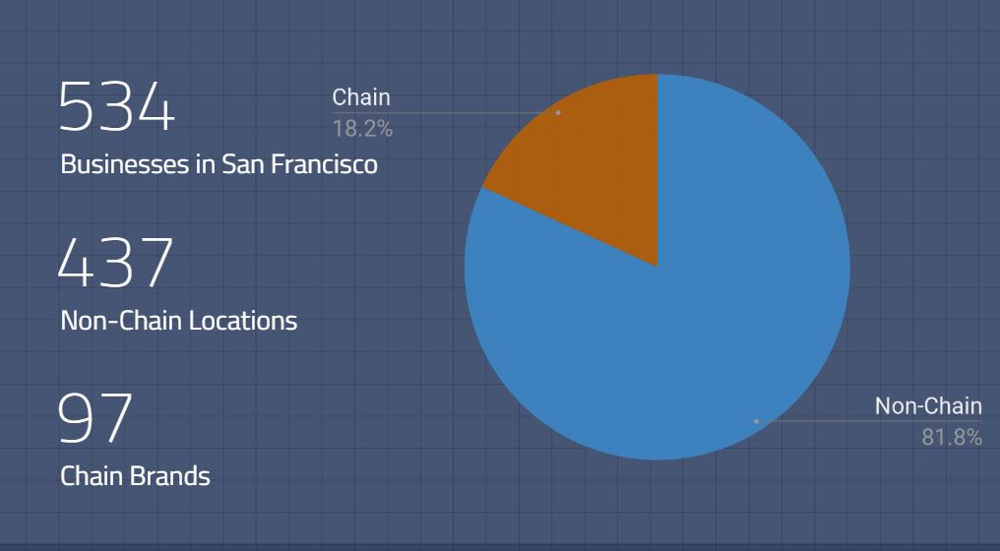

In [13]:
Image(filename='Basic_analysis.JPG', width=600)

Further analyzing the chain cafes, we see that approx. 70% of them are Starbucks.

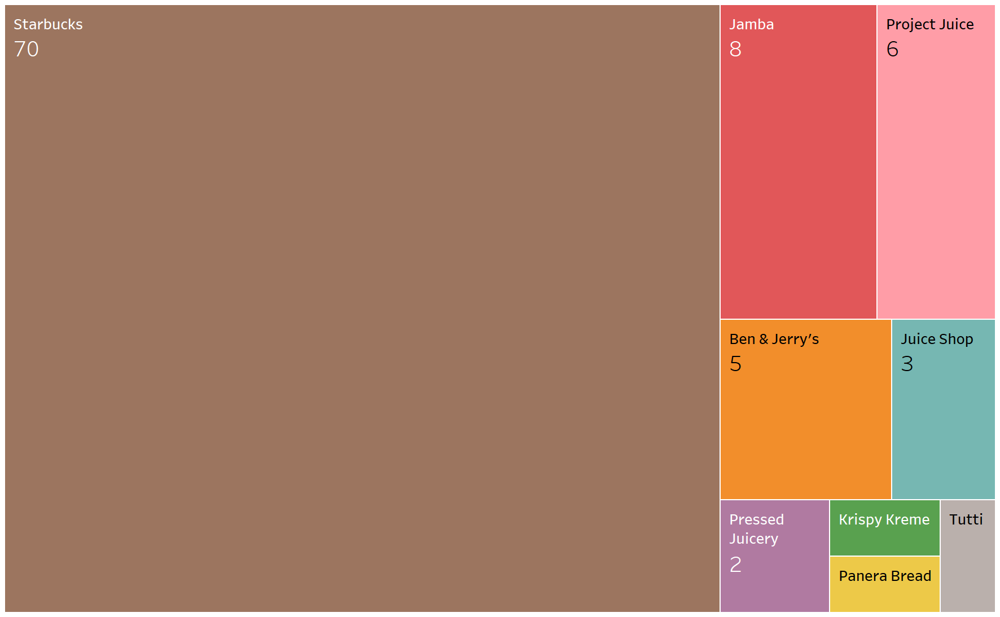

In [14]:
Image(filename='Brand_Distribution.png', width=600)

**Plotting the geographic extent of our data (All cafes) on the map using Tableau and the shapefiles included with the dataset and seen later in the analysis.**

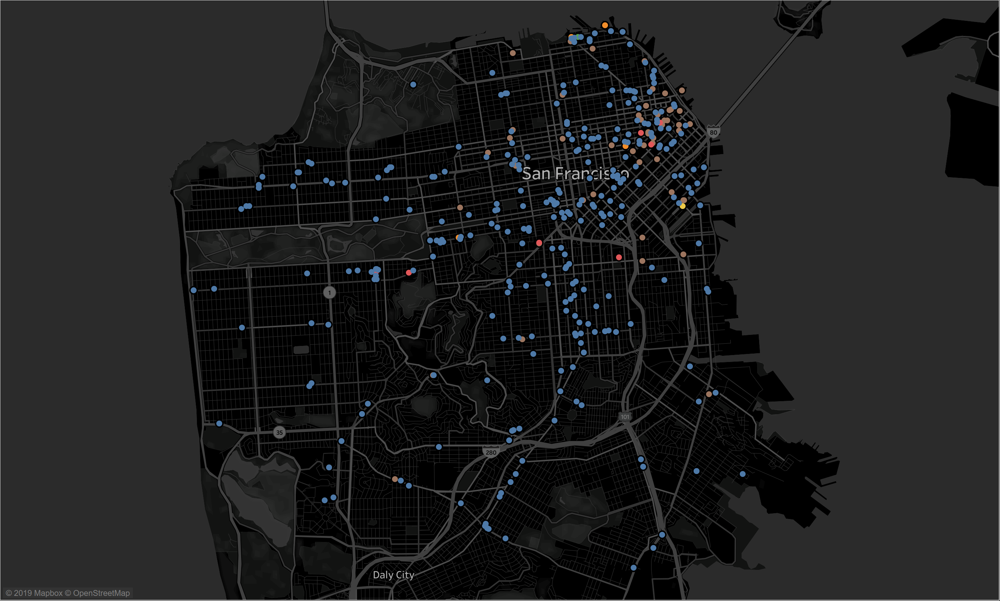

In [15]:
Image(filename='geographic_extent.png', width=1000)

<br>**Plotting only the chain brands on the map to analyze how they're located throughtout the city. We found out that 90% of the chain stores are located in the small radius around the downtown district.**

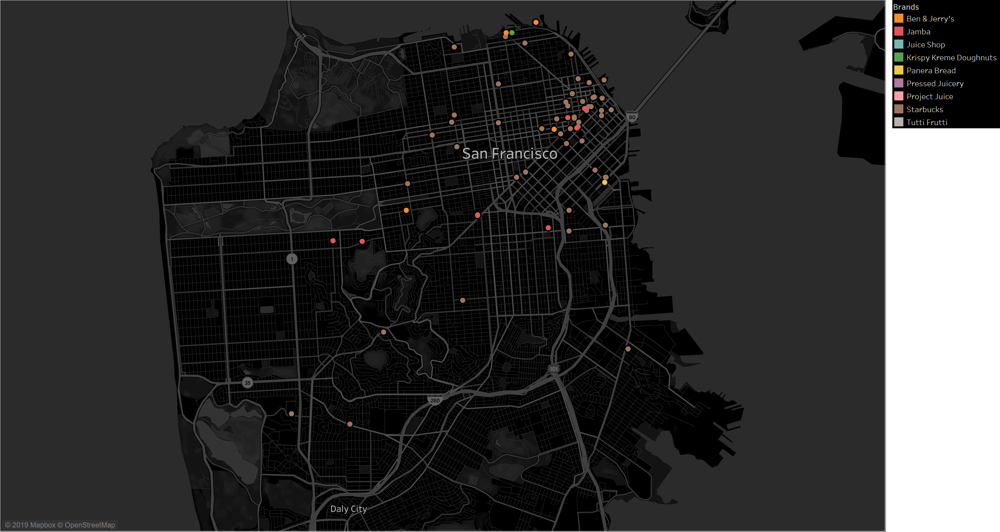

In [16]:
Image(filename='geographic_extent_only_chain.png', width=1000)

#### **Popularity by hour** <br>
The data set includes data for each business, representing the foot-traffic in that business during each hour of the day. This data is stored in list objects with 24 values - one for each hour of the day. Extracting this and cleaning it to only show information for the hours that the business shows to be open.

In [17]:
popularity_hour = clean_patterns_core[['safegraph_place_id', 'location_name', 'brands',  'popularity_by_hour', 'open_hours']]

Checking for % of null values

In [18]:
len(popularity_hour[popularity_hour.open_hours.isna()])/len(popularity_hour)

0.2846441947565543

Only considering the not null values

In [19]:
popularity_hour = popularity_hour[pd.notna(popularity_hour['open_hours'])]

Creating functions for extracting the start and end time

In [20]:
def clean_starttime(x):
    if x:
        return int(x[0][0].split(':')[0])
    else:
        return float('NaN')

In [21]:
def clean_endtime(x):
    if x:
        return int(x[0][1].split(':')[0])
    else:
        return float('NaN')

**For the sake of analysis, Wednesday will be used to represent a typical day. The open hours for Wednesday will be used for visualization purposes.**

In [22]:
popularity_hour['start_time']=popularity_hour.open_hours.apply(lambda x : clean_starttime(json.loads(x)['Wed']))
popularity_hour['end_time']=popularity_hour.open_hours.apply(lambda x : clean_endtime(json.loads(x)['Wed']))

In [23]:
popularity_hour = popularity_hour[popularity_hour.start_time.notna()]

In [24]:
popularity_hour.head().T

,1,3,5,6,7
safegraph_place_id,sg:118c95bf3c4e4370920d7a026fd3ebbe,sg:de408f31b2cd4eb783cc5de4ad6ed651,sg:a8248377476f4f40ac9eeaef65279570,sg:58be0fc40bc54869aad901c0a58458f7,sg:521f82bd4a1c40d4b672f0fb9330d052
location_name,Royal Ground Coffee,Wholesome Bakery,Happy Donuts,Sightglass Coffee,Muddy Waters Coffee House
brands,NaN,NaN,NaN,NaN,NaN
popularity_by_hour,"[33,33,32,32,33,32,32,30,18,7,6,4,3,1,0,0,0,7,...","[36,35,35,37,37,37,42,47,46,38,49,53,56,52,38,...","[29,30,32,32,32,25,25,29,27,31,34,34,41,42,36,...","[16,15,9,7,7,7,10,9,15,17,14,17,12,13,15,26,22...","[3,6,2,2,0,0,0,0,6,5,11,19,23,27,25,18,18,13,2..."
open_hours,"{ ""Mon"": [[""6:30"", ""22:00""]], ""Tue"": [[""6:30"",...","{ ""Mon"": [[""7:00"", ""19:00""]], ""Tue"": [[""7:00"",...","{ ""Mon"": [[""5:30"", ""20:00""]], ""Tue"": [[""5:30"",...","{ ""Mon"": [[""7:00"", ""19:00""]], ""Tue"": [[""7:00"",...","{ ""Mon"": [[""6:00"", ""23:00""]], ""Tue"": [[""6:00"",..."
start_time,6,7,5,7,6
end_time,22,19,20,19,23


**A plot showing the number of business opening at each hour of the day.**

Text(0.5, 1.0, 'Common start time hours')

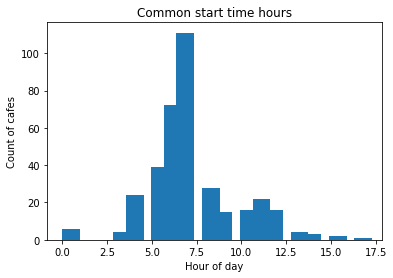

In [76]:
ph = popularity_hour.start_time.plot.hist(bins=24, width=1)
ph.set_xlabel('Hour of day')
ph.set_ylabel('Count of cafes')
ph.set_title('Common start time hours')

**A similar plot done on tableau to find the number of cafes opening at each hour of the day. Most common time for cafes to open is 6:00-8:00 AM**

In [26]:
popularity_hour.to_csv('start_end_time.csv')

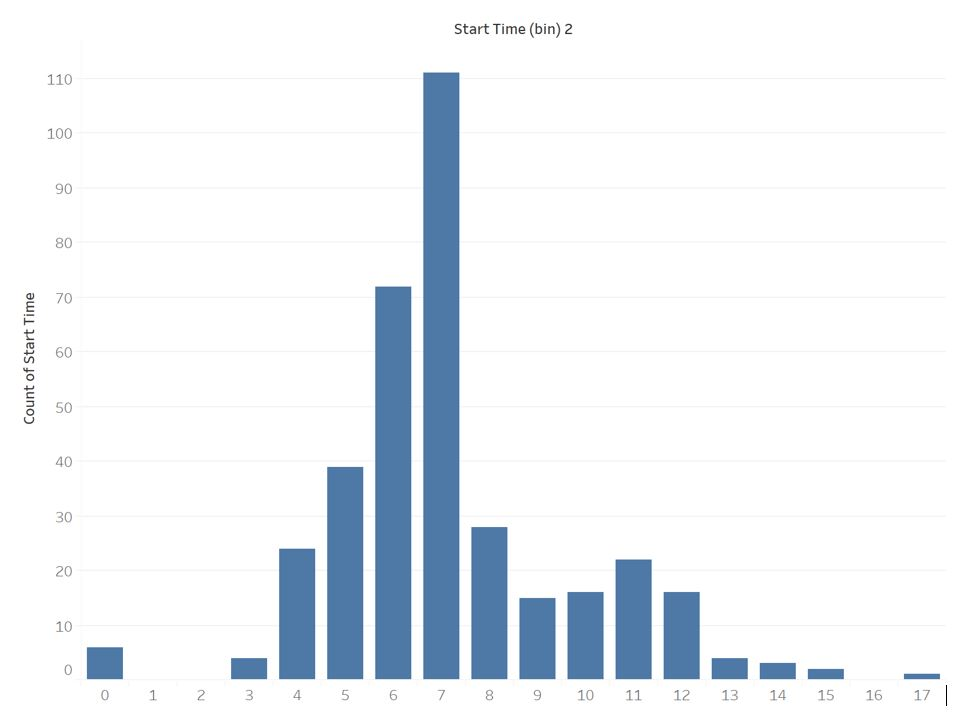

In [27]:
Image(filename='start_time.JPG', width=500)

**A plot done on tableau to find the number of cafes closing at each hour of the day. Most common time for cafes to close is 6:00-8:00 pm.**

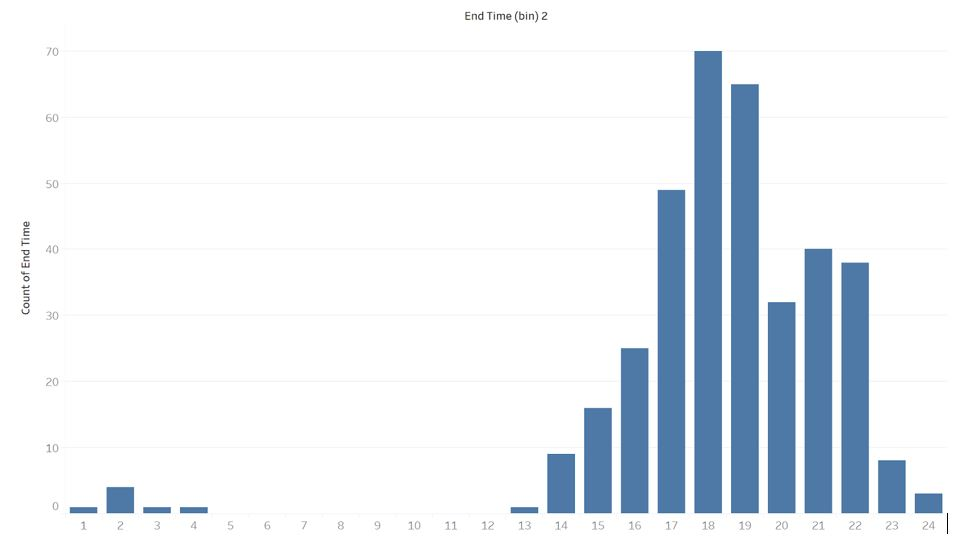

In [28]:
Image(filename='end_time.JPG', width=500)

### **Now we find the average popularity of each cafe throughout the day and then plot it using mapbox and javascript**

In [29]:
popularity_hour_list = popularity_hour.values.tolist()

In [31]:
for x1 in popularity_hour_list:
    x1[3] = [int(x1[3].strip('][').split(",")[i]) if (i+1) > x1[5] and (i+1) < x1[6] else 0 for i in range(len(x1[3].split(",")))]

In [32]:
popularity_hour_dataframe = pd.DataFrame(popularity_hour_list)

In [33]:
popularity_hour_dataframe

,0,1,2,3,4,5,6
0,sg:118c95bf3c4e4370920d7a026fd3ebbe,Royal Ground Coffee,NaN,"[0, 0, 0, 0, 0, 0, 32, 30, 18, 7, 6, 4, 3, 1, ...","{ ""Mon"": [[""6:30"", ""22:00""]], ""Tue"": [[""6:30"",...",6.0,22.0
1,sg:de408f31b2cd4eb783cc5de4ad6ed651,Wholesome Bakery,NaN,"[0, 0, 0, 0, 0, 0, 0, 47, 46, 38, 49, 53, 56, ...","{ ""Mon"": [[""7:00"", ""19:00""]], ""Tue"": [[""7:00"",...",7.0,19.0
2,sg:a8248377476f4f40ac9eeaef65279570,Happy Donuts,NaN,"[0, 0, 0, 0, 0, 25, 25, 29, 27, 31, 34, 34, 41...","{ ""Mon"": [[""5:30"", ""20:00""]], ""Tue"": [[""5:30"",...",5.0,20.0
3,sg:58be0fc40bc54869aad901c0a58458f7,Sightglass Coffee,NaN,"[0, 0, 0, 0, 0, 0, 0, 9, 15, 17, 14, 17, 12, 1...","{ ""Mon"": [[""7:00"", ""19:00""]], ""Tue"": [[""7:00"",...",7.0,19.0
4,sg:521f82bd4a1c40d4b672f0fb9330d052,Muddy Waters Coffee House,NaN,"[0, 0, 0, 0, 0, 0, 0, 0, 6, 5, 11, 19, 23, 27,...","{ ""Mon"": [[""6:00"", ""23:00""]], ""Tue"": [[""6:00"",...",6.0,23.0
5,sg:3f5759808277493ca55953724d4d6a21,Reveille Coffee Co Truck,NaN,"[0, 0, 0, 0, 0, 0, 0, 3, 4, 3, 3, 3, 3, 2, 0, ...","{ ""Mon"": [[""7:30"", ""15:00""]], ""Tue"": [[""7:30"",...",7.0,15.0
6,sg:4c2cb694bb594c839459344674fcad1d,Chocolate Chair,NaN,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 173, 309, 399, ...","{ ""Mon"": [[""10:00"", ""21:00""]], ""Tue"": [[""10:00...",10.0,21.0
7,sg:094b444cc4e247d691893d17dcafbd9e,Cantata Coffee Company,NaN,"[0, 0, 0, 0, 0, 0, 0, 62, 40, 54, 63, 66, 82, ...","{ ""Mon"": [[""7:30"", ""20:00""]], ""Tue"": [[""7:30"",...",7.0,20.0
8,sg:1fc761fef5c94e609756370c535d1122,Starbucks,Starbucks,"[0, 0, 0, 0, 0, 31, 22, 32, 55, 49, 64, 71, 91...","{ ""Mon"": [[""5:30"", ""20:00""]], ""Tue"": [[""5:30"",...",5.0,20.0
9,sg:1387c131cbec4619a6465e27f03993dc,Breakfast Little,NaN,"[0, 0, 0, 0, 0, 0, 9, 10, 12, 13, 10, 9, 8, 11...","{ ""Mon"": [[""6:00"", ""18:00""]], ""Tue"": [[""6:00"",...",6.0,18.0


In [34]:
popularity_hour_dataframe = popularity_hour_dataframe.drop(columns=[4,5,6])

In [35]:
popularity_hour_dataframe.head()

,0,1,2,3
0,sg:118c95bf3c4e4370920d7a026fd3ebbe,Royal Ground Coffee,NaN,"[0, 0, 0, 0, 0, 0, 32, 30, 18, 7, 6, 4, 3, 1, ..."
1,sg:de408f31b2cd4eb783cc5de4ad6ed651,Wholesome Bakery,NaN,"[0, 0, 0, 0, 0, 0, 0, 47, 46, 38, 49, 53, 56, ..."
2,sg:a8248377476f4f40ac9eeaef65279570,Happy Donuts,NaN,"[0, 0, 0, 0, 0, 25, 25, 29, 27, 31, 34, 34, 41..."
3,sg:58be0fc40bc54869aad901c0a58458f7,Sightglass Coffee,NaN,"[0, 0, 0, 0, 0, 0, 0, 9, 15, 17, 14, 17, 12, 1..."
4,sg:521f82bd4a1c40d4b672f0fb9330d052,Muddy Waters Coffee House,NaN,"[0, 0, 0, 0, 0, 0, 0, 0, 6, 5, 11, 19, 23, 27,..."


In [36]:
popularity_hour_dataframe = popularity_hour_dataframe.rename(columns={0: "safegraph_", 1: "Name", 2:"Brands", 3: "Hours"})

In [37]:
for i in range(24):
    popularity_hour_dataframe[str(i+1)] = popularity_hour_dataframe['Hours'].apply(lambda x:x[i])

In [38]:
popularity_hour_dataframe = popularity_hour_dataframe.drop(columns=['Hours'])

**A simplified version of the traffic data. Now there is a column for each hour of the day with a value for each business.**

In [39]:
popularity_hour_dataframe.head()

,safegraph_,Name,Brands,1,2,3,4,5,6,7,...,15,16,17,18,19,20,21,22,23,24
0,sg:118c95bf3c4e4370920d7a026fd3ebbe,Royal Ground Coffee,NaN,0,0,0,0,0,0,32,...,0,0,0,7,19,28,26,0,0,0
1,sg:de408f31b2cd4eb783cc5de4ad6ed651,Wholesome Bakery,NaN,0,0,0,0,0,0,0,...,38,31,21,21,0,0,0,0,0,0
2,sg:a8248377476f4f40ac9eeaef65279570,Happy Donuts,NaN,0,0,0,0,0,25,25,...,36,37,30,19,30,0,0,0,0,0
3,sg:58be0fc40bc54869aad901c0a58458f7,Sightglass Coffee,NaN,0,0,0,0,0,0,0,...,15,26,22,15,0,0,0,0,0,0
4,sg:521f82bd4a1c40d4b672f0fb9330d052,Muddy Waters Coffee House,NaN,0,0,0,0,0,0,0,...,25,18,18,13,24,30,24,11,0,0


**The third and final component of the dataset is a set of shape files, showing the outline of each of the business. Instead of the outlines, a centroid will be more useful, allowing for a bubble map of locations.**

In [40]:
with fiona.open('Data/CA-722515-GEOMETRY-2019-09-27.shp') as src:
    meta = src.meta
    meta['schema']['geometry'] = 'Point'
    with fiona.open('Data/centroids.shp', 'w', **meta) as dst:
        for f in src:
            centroid = shape(f['geometry']).centroid
            f['geometry'] = mapping(centroid)
            dst.write(f)

In [41]:
centroids= gpd.read_file('Data/centroids.shp')

In [42]:
centroids

,safegraph_,latitude,longitude,polygon_wk,polygon_cl,includes_p,is_synthet,geometry
0,sg:00869b0a136843b4a66e694b3b45e2d9,37.764001,-122.472452,"POLYGON ((-122.472361 37.763894, -122.472361 3...",SHARED_POLYGON,false,false,POINT (-122.4724566227911 37.76398936268813)
1,sg:009c2b9de4dc44ef9c7b9dcfa54681fe,37.756429499999996,-122.42136791017316,"POLYGON ((-122.421234 37.756465, -122.421228 3...",OWNED_POLYGON,false,false,POINT (-122.4213652221911 37.7564248386236)
2,sg:00a710f8296f44cd80d01163ae0465ed,37.744572000000005,-122.45259931380347,"POLYGON ((-122.452566 37.744687, -122.452408 3...",OWNED_POLYGON,false,false,POINT (-122.4525977933341 37.74456934804476)
3,sg:00cd796bf58c4b5fa3c44ef2e48511f8,37.788579,-122.403848,"POLYGON ((-122.403734 37.788574, -122.40392 37...",SHARED_POLYGON,false,false,POINT (-122.4038327414617 37.78858809457395)
4,sg:013417b2677a4208ae0695283cfd3bf8,37.795874,-122.393894,"POLYGON ((-122.393875 37.796417, -122.392516 3...",SHARED_POLYGON,false,false,POINT (-122.393428734562 37.79554508199022)
5,sg:01550a289d2e49a5a312c5054246db92,37.785227,-122.464776,"POLYGON ((-122.464827 37.78518, -122.46483 37....",SHARED_POLYGON,false,false,POINT (-122.4647723714802 37.78521388198556)
6,sg:01a2459ca69d48a8beb911ba230c3b4d,37.738747,-122.414194,"POLYGON ((-122.414158 37.738637, -122.414291 3...",SHARED_POLYGON,false,false,POINT (-122.4142128425273 37.73873741316459)
7,sg:0239ede70d704ff39257878ad0a65979,37.773709,-122.466143,"POLYGON ((-122.46604 37.773791, -122.466034 37...",SHARED_POLYGON,false,false,POINT (-122.4661687688007 37.77363584049707)
8,sg:0243ddf3ec9847dc8e8789c17fe66342,37.797341,-122.40881821739131,"POLYGON ((-122.408664 37.797318, -122.408657 3...",OWNED_POLYGON,false,false,POINT (-122.4088141777693 37.79732062608013)
9,sg:0249ef6c8be34080a962dda6a5d2c3db,37.787969,-122.407512,"POLYGON ((-122.40745887832102 37.7879754, -122...",SHARED_POLYGON,None,true,POINT (-122.4075105972194 37.78795018316688)


**The centroid values are merged with the hourly traffic data, producing a product nearly ready to map.**

In [43]:
centroid_hours = centroids.merge(popularity_hour_dataframe, on='safegraph_')

In [44]:
centroid_hours

,safegraph_,latitude,longitude,polygon_wk,polygon_cl,includes_p,is_synthet,geometry,Name,Brands,...,15,16,17,18,19,20,21,22,23,24
0,sg:00869b0a136843b4a66e694b3b45e2d9,37.764001,-122.472452,"POLYGON ((-122.472361 37.763894, -122.472361 3...",SHARED_POLYGON,false,false,POINT (-122.4724566227911 37.76398936268813),Cafe La Flore Irving,NaN,...,9,4,2,9,0,0,0,0,0,0
1,sg:00a710f8296f44cd80d01163ae0465ed,37.744572000000005,-122.45259931380347,"POLYGON ((-122.452566 37.744687, -122.452408 3...",OWNED_POLYGON,false,false,POINT (-122.4525977933341 37.74456934804476),Creighton's American Bakery,NaN,...,64,73,55,0,0,0,0,0,0,0
2,sg:0239ede70d704ff39257878ad0a65979,37.773709,-122.466143,"POLYGON ((-122.46604 37.773791, -122.466034 37...",SHARED_POLYGON,false,false,POINT (-122.4661687688007 37.77363584049707),Rise & Grind Coffee and Tea,NaN,...,79,85,0,0,0,0,0,0,0,0
3,sg:0271e7864e6d4749851def6888cff5dc,37.797686,-122.407087,"POLYGON ((-122.406998 37.797349, -122.407094 3...",SHARED_POLYGON,false,false,POINT (-122.4072447297251 37.79750759474311),T & T Cafe,NaN,...,29,18,21,19,20,19,24,30,0,0
4,sg:047141fee75b41e7a1c51e6efd986585,37.800195,-122.401136,"POLYGON ((-122.400787 37.800208, -122.40126 37...",SHARED_POLYGON,false,false,POINT (-122.4010371004902 37.80023817779411),Battery Street Coffee Roastery,NaN,...,54,51,0,0,0,0,0,0,0,0
5,sg:0653fef9186d4a54869e05a967cc67db,37.7374435,-122.46931362679658,"POLYGON ((-122.469196 37.737401, -122.469253 3...",OWNED_POLYGON,false,false,POINT (-122.4693150464052 37.73744509673201),Ballast Coffee,NaN,...,16,17,0,0,0,0,0,0,0,0
6,sg:06a09094524947d5806a68e05218ac1d,37.7526515,-122.40960769741014,"POLYGON ((-122.40965 37.752558, -122.409654 37...",OWNED_POLYGON,false,false,POINT (-122.4096084850739 37.75261943171358),L's Caffe,NaN,...,0,0,0,0,0,0,0,0,0,0
7,sg:06ecce514f564f15ba5027d29e6f75db,37.728769,-122.431568,"POLYGON ((-122.431741 37.728893, -122.431647 3...",SHARED_POLYGON,false,false,POINT (-122.4316992048193 37.72870642365735),Silver Cafe,NaN,...,27,25,32,84,0,0,0,0,0,0
8,sg:076f4fe5e22e4a5f8ac4d3254f64bc66,37.791478,-122.399476,"POLYGON ((-122.399209 37.791478, -122.399488 3...",SHARED_POLYGON,false,false,POINT (-122.3993717394599 37.79158464686468),Jamba,Jamba,...,171,172,0,0,0,0,0,0,0,0
9,sg:08e4a389c1ee4c7a98cf1d2781fc32e3,37.779478,-122.493558,"MULTIPOLYGON (((-122.493847 37.779513, -122.49...",SHARED_POLYGON,false,false,POINT (-122.4935980690797 37.77938849759411),Sugarcane SF,NaN,...,5,8,5,7,11,6,0,0,0,0


**A `geojson` file will serve well for mapping purposes**


In [45]:
centroid_hours.to_file("centroid_hours3.geojson", driver='GeoJSON')

#### **A live version of an animated visualization can be seen at the below link.**

http://htmlpreview.github.io/?https://github.com/darshitpd/San-Francisco-Cafe-Data-Analysis/blob/master/Web-animations/san_fran_cafe_hourly1.html

**This screen capture shows the location of the cafes with the small blue dots. The hour represented is midnight, so almost all cafes are closed showing no business.**

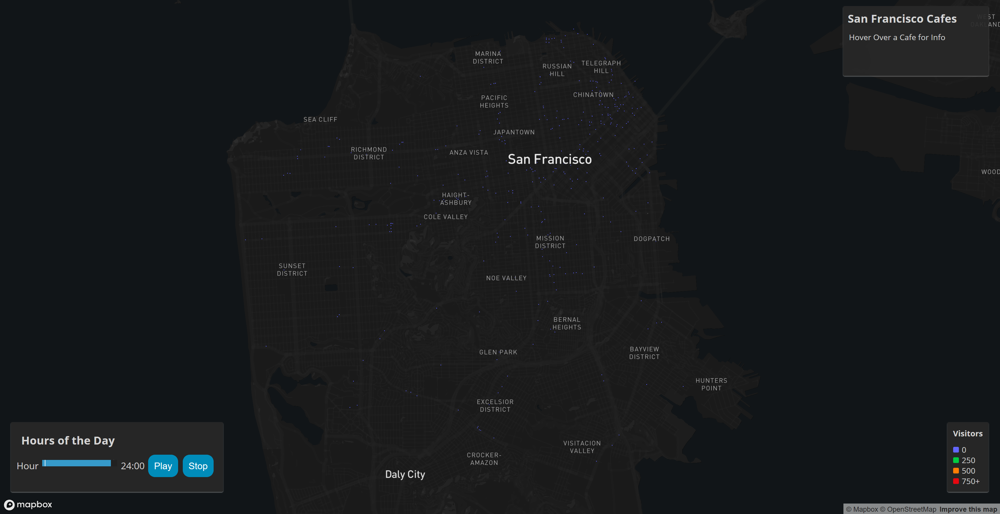

In [46]:
Image(filename='Midnight.png', width=1000)

**In contrast, this screen capture represents mid-day. Now nearly all cafes are open and are colored and sized relative to their number of visitors.**

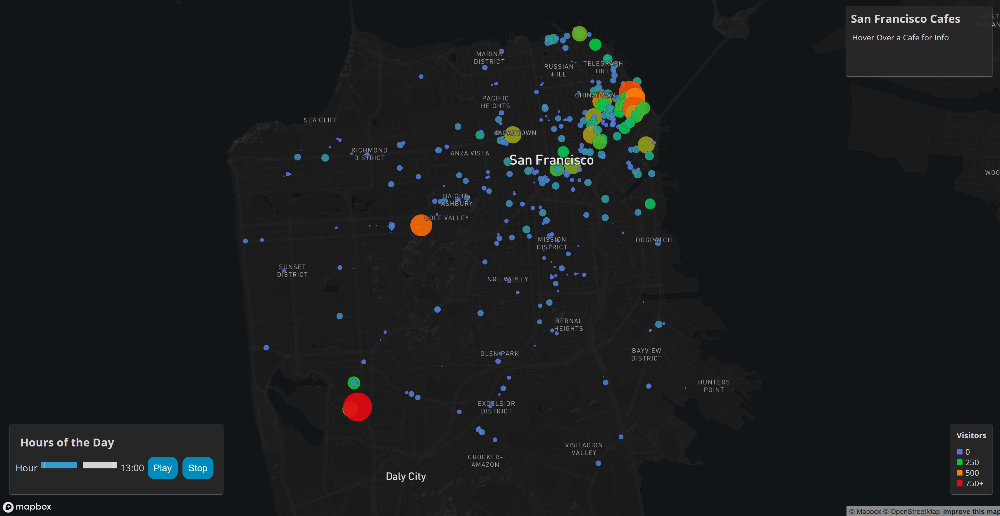

In [47]:
Image(filename='Midday.png', width=1000)

***Analyzing the traffic near the cafes when they're closed***

In [48]:
popularity_hour.head()

,safegraph_place_id,location_name,brands,popularity_by_hour,open_hours,start_time,end_time
1,sg:118c95bf3c4e4370920d7a026fd3ebbe,Royal Ground Coffee,NaN,"[33,33,32,32,33,32,32,30,18,7,6,4,3,1,0,0,0,7,...","{ ""Mon"": [[""6:30"", ""22:00""]], ""Tue"": [[""6:30"",...",6.0,22.0
3,sg:de408f31b2cd4eb783cc5de4ad6ed651,Wholesome Bakery,NaN,"[36,35,35,37,37,37,42,47,46,38,49,53,56,52,38,...","{ ""Mon"": [[""7:00"", ""19:00""]], ""Tue"": [[""7:00"",...",7.0,19.0
5,sg:a8248377476f4f40ac9eeaef65279570,Happy Donuts,NaN,"[29,30,32,32,32,25,25,29,27,31,34,34,41,42,36,...","{ ""Mon"": [[""5:30"", ""20:00""]], ""Tue"": [[""5:30"",...",5.0,20.0
6,sg:58be0fc40bc54869aad901c0a58458f7,Sightglass Coffee,NaN,"[16,15,9,7,7,7,10,9,15,17,14,17,12,13,15,26,22...","{ ""Mon"": [[""7:00"", ""19:00""]], ""Tue"": [[""7:00"",...",7.0,19.0
7,sg:521f82bd4a1c40d4b672f0fb9330d052,Muddy Waters Coffee House,NaN,"[3,6,2,2,0,0,0,0,6,5,11,19,23,27,25,18,18,13,2...","{ ""Mon"": [[""6:00"", ""23:00""]], ""Tue"": [[""6:00"",...",6.0,23.0


In [49]:
popularity_hour_closed_list = popularity_hour.values.tolist()

In [50]:
popularity_hour_closed_list

[['sg:118c95bf3c4e4370920d7a026fd3ebbe',
  'Royal Ground Coffee',
  nan,
  '[33,33,32,32,33,32,32,30,18,7,6,4,3,1,0,0,0,7,19,28,26,32,37,35]',
  '{ "Mon": [["6:30", "22:00"]], "Tue": [["6:30", "22:00"]], "Wed": [["6:30", "22:00"]], "Thu": [["6:30", "22:00"]], "Fri": [["6:30", "22:00"]], "Sat": [["6:30", "22:00"]], "Sun": [["6:30", "22:00"]] }',
  6.0,
  22.0],
 ['sg:de408f31b2cd4eb783cc5de4ad6ed651',
  'Wholesome Bakery',
  nan,
  '[36,35,35,37,37,37,42,47,46,38,49,53,56,52,38,31,21,21,39,39,39,37,37,39]',
  '{ "Mon": [["7:00", "19:00"]], "Tue": [["7:00", "19:00"]], "Wed": [["7:00", "19:00"]], "Thu": [["7:00", "19:00"]], "Fri": [["7:00", "19:00"]], "Sat": [["7:00", "19:00"]], "Sun": [["7:00", "19:00"]] }',
  7.0,
  19.0],
 ['sg:a8248377476f4f40ac9eeaef65279570',
  'Happy Donuts',
  nan,
  '[29,30,32,32,32,25,25,29,27,31,34,34,41,42,36,37,30,19,30,29,29,27,32,31]',
  '{ "Mon": [["5:30", "20:00"]], "Tue": [["5:30", "20:00"]], "Wed": [["5:30", "20:00"]], "Thu": [["5:30", "20:00"]], "Fri":

In [51]:
for x1 in popularity_hour_closed_list:
    x1[3] = [int(x1[3].strip('][').split(",")[i]) if (i+1) < x1[5] or (i+1) > x1[6] else 0 for i in range(len(x1[3].split(",")))]

In [52]:
popularity_hour_closed_dataframe = pd.DataFrame(popularity_hour_closed_list)

In [53]:
popularity_hour_closed_dataframe = popularity_hour_closed_dataframe.drop(columns=[4,5,6])

In [54]:
popularity_hour_closed_dataframe.head()

,0,1,2,3
0,sg:118c95bf3c4e4370920d7a026fd3ebbe,Royal Ground Coffee,NaN,"[33, 33, 32, 32, 33, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
1,sg:de408f31b2cd4eb783cc5de4ad6ed651,Wholesome Bakery,NaN,"[36, 35, 35, 37, 37, 37, 0, 0, 0, 0, 0, 0, 0, ..."
2,sg:a8248377476f4f40ac9eeaef65279570,Happy Donuts,NaN,"[29, 30, 32, 32, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
3,sg:58be0fc40bc54869aad901c0a58458f7,Sightglass Coffee,NaN,"[16, 15, 9, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
4,sg:521f82bd4a1c40d4b672f0fb9330d052,Muddy Waters Coffee House,NaN,"[3, 6, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [55]:
popularity_hour_closed_dataframe = popularity_hour_closed_dataframe.rename(columns={0: "safegraph_", 1: "Name", 2: "Brands", 3: "Hours"})

In [56]:
for i in range(24):
    popularity_hour_closed_dataframe[str(i+1)] = popularity_hour_closed_dataframe['Hours'].apply(lambda x:x[i])

In [57]:
popularity_hour_closed_dataframe = popularity_hour_closed_dataframe.drop(columns=['Hours'])

In [58]:
popularity_hour_closed_dataframe.head()

,safegraph_,Name,Brands,1,2,3,4,5,6,7,...,15,16,17,18,19,20,21,22,23,24
0,sg:118c95bf3c4e4370920d7a026fd3ebbe,Royal Ground Coffee,NaN,33,33,32,32,33,0,0,...,0,0,0,0,0,0,0,0,37,35
1,sg:de408f31b2cd4eb783cc5de4ad6ed651,Wholesome Bakery,NaN,36,35,35,37,37,37,0,...,0,0,0,0,0,39,39,37,37,39
2,sg:a8248377476f4f40ac9eeaef65279570,Happy Donuts,NaN,29,30,32,32,0,0,0,...,0,0,0,0,0,0,29,27,32,31
3,sg:58be0fc40bc54869aad901c0a58458f7,Sightglass Coffee,NaN,16,15,9,7,7,7,0,...,0,0,0,0,0,43,39,33,32,19
4,sg:521f82bd4a1c40d4b672f0fb9330d052,Muddy Waters Coffee House,NaN,3,6,2,2,0,0,0,...,0,0,0,0,0,0,0,0,0,6


In [59]:
centroid_closed_hours = centroids.merge(popularity_hour_closed_dataframe, on='safegraph_')

In [60]:
centroid_closed_hours.to_file("centroid_closed_hours3.geojson", driver='GeoJSON')

### As we have the open and closed time, and traffic around the cafes both when they're open and closed, we can use that to find places which might be possible locations to find a new cafe location. ### 

The data collection method is picking up traffic (represented in red) at most of the locations, even when they are shown to be closed. This suggests that in some fashion there is still foot traffic near these locations, potentially traffic that could be taken advantage of for business purposes.

**A live version of an animated visualization can be seen at the below link. Detailed exploration of this tool could reveal numerous potential sites.**

https://htmlpreview.github.io/?https://github.com/darshitpd/San-Francisco-Cafe-Data-Analysis/blob/master/Web-animations/san_fran_cafe_all.html

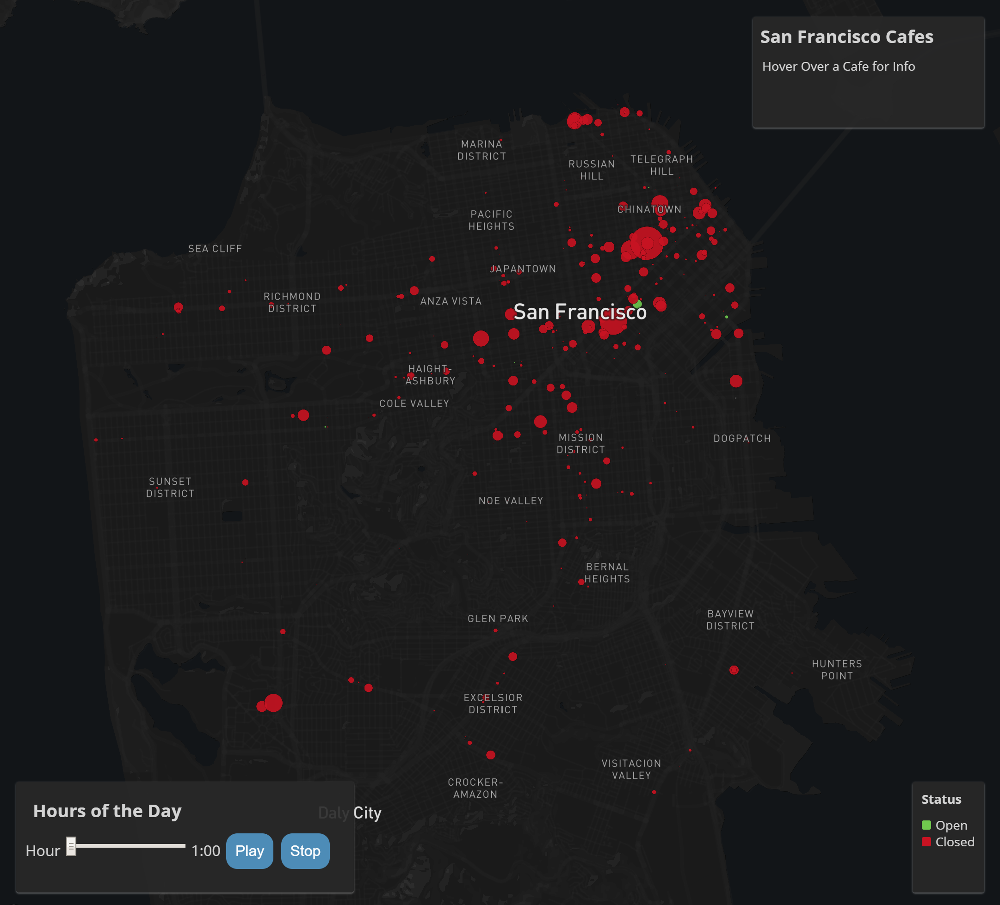

In [68]:
Image(filename='1am.png', width=800)

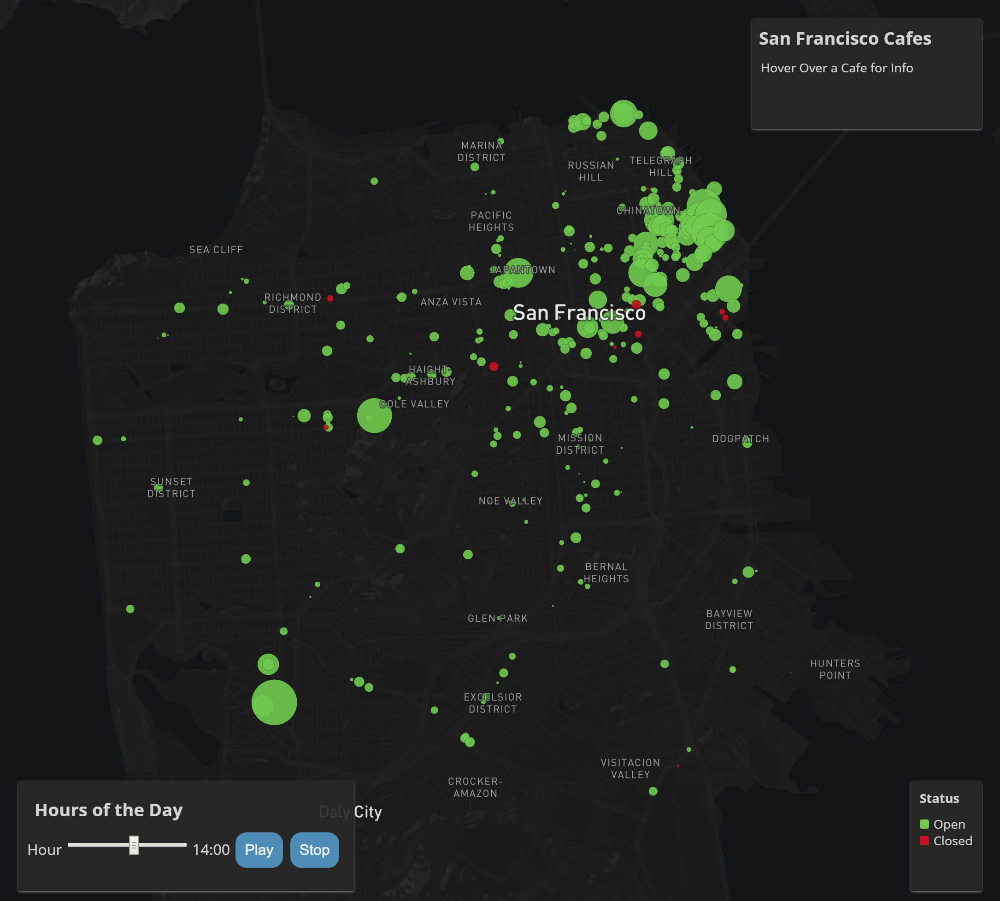

In [69]:
Image(filename='2pm.png', width=800)

### Mission and 8th St Intersection

By viewing the data in this way, it is possible to identify potential locations where traffic is high, even though shops are closed. One particular location that demonstrated this idea is near the Mission and 8th St Intersection. There is a bakery in the area that shows high traffic during all of its open hours, but it closes particularly early - approximately 4pm. Even after it is closed, the location and other surrounding locations show steady rates of human traffic, suggesting the possibility that there is un-tapped potential in this area for further business development, particularly in the later afternoon and evening hours.

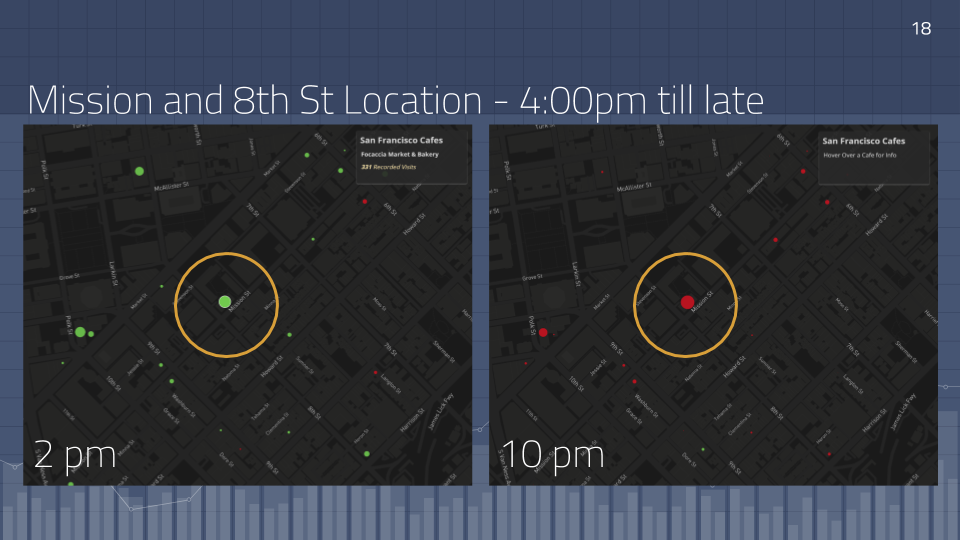

In [70]:
Image(filename='Copy of Project 1 Final Presentation.png', width=1000)

## **Further analysis** ##

##### 20 Minutes is the most common customer dwell time for chain stores #####
With all median customer dwell times in chains topping out at 90 minutes. Assuming that chain stores have done extensive market research for profitability, the 20-40 minute time frame appears to be the ideal time for customer dwell.

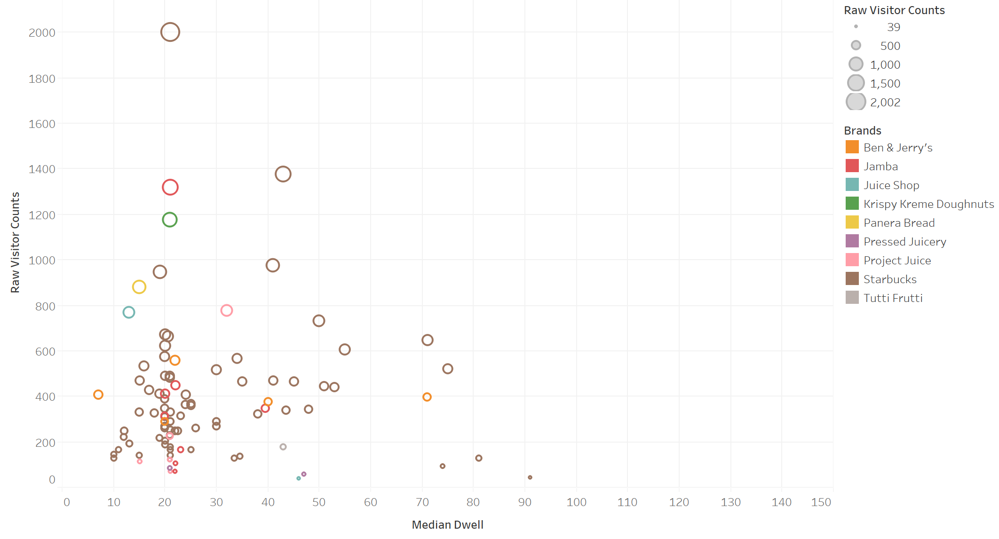

In [71]:
Image(filename='Dwell_Chain.png', width=800)

##### All dwell times longer than 90 minutes are found at non-chain stores ######
Non-chain stores have clustered dwells at 20 and 40, but also have many instances of longer median dwell times. These long dwell stores also seem to have very small numbers of customers, suggesting that these shops are not thriving to the extent of the stores with faster customer turn-over.

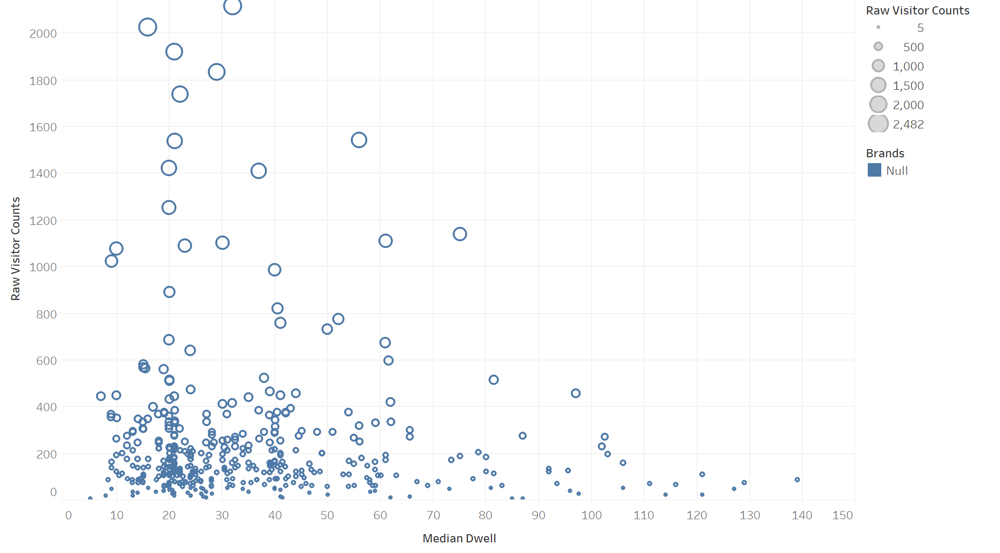

In [77]:
Image(filename='Dwell2.png', width=800)

### **Stategies**

If a shop is committed to the idea of facilitating long customer experiences, one potential approach would be to follow the example of this Brooklyn shop which charges customers not by the item, but by the minute above 1 hour (after paying a $6 base fee.)

https://www.businessinsider.com/coffee-shop-charges-for-time-spent-2016-10



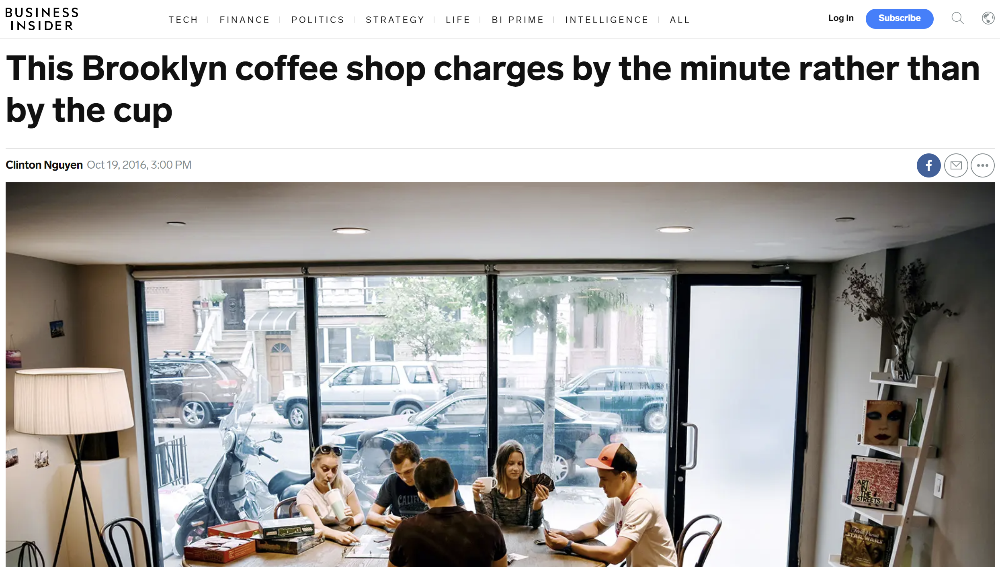

In [73]:
Image(filename='Annotation 2019-10-16 143234.png', width=1000)

<br>
<br>
<br>


## Data Concerns

Although the data is interesting and may provide some business insight, it is necessary to also provide some caution about its use and realiability.

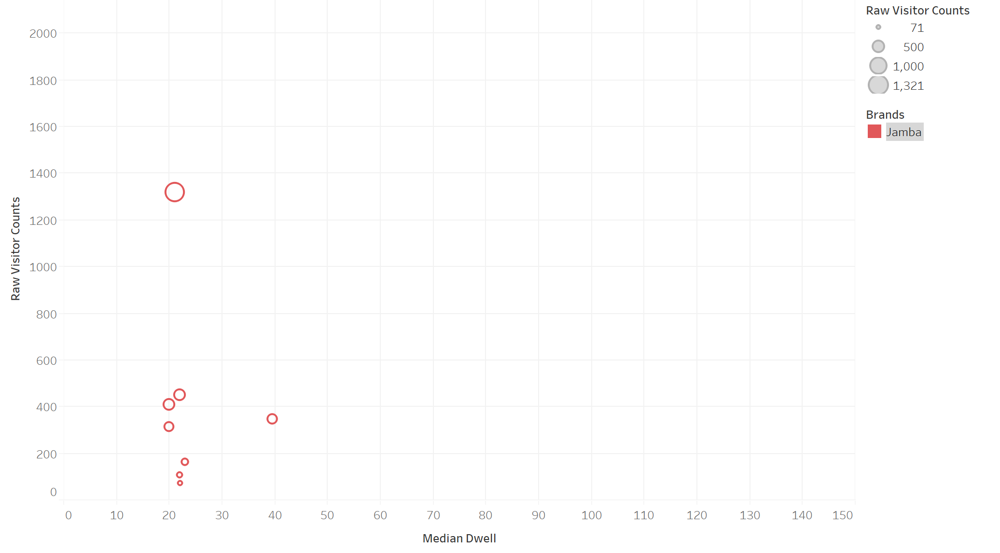

In [74]:
Image(filename='Jamba.png', width=1000)

**The above chart shows the median customer dwell time for all Jamba Juice stores. There is a high level of consistency clustered at the 20 min mark. Oddly, there is one store which shows double the time. Looking up this store's location reveals something interesting.**

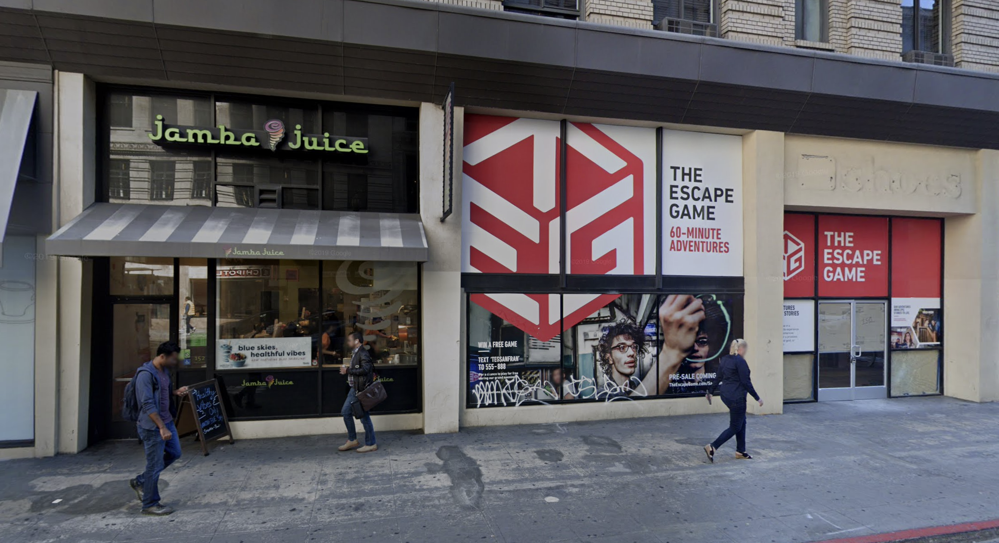

In [75]:
Image(filename='Annotation 2019-10-15 170550.png', width=1000)

**The store location is directly next to an escape room location that advertises 60min customer experiences. If indeed this store is actually giving 20min turn-around for customers, it seems likely that the 40 min times are being corrupted by data from the store next door, mixing with the Jamba location. Perhaps some of the customers shown by GPS to be at the Jamba location are actually at the adjacent business and staying longer. This is just one particularly clear example of many such potential issues in the data.**

### A SafeGraph employee admitted that there are flaws and reliabiltiy issues with the data
“There is always inherent noise in our visit attribution algorithm, due to jumpiness/errors in GPS data (such as GPS drift, GPS ping scattering in city environments)”

“Our visit data is collected from a panel of mobile GPS devices data. The likely reasons you would see visits outside of business hours are (1) we are picking up visits in the building which are not to the actual POI (for instance a condo over a Starbucks) or (2) we are picking up night workers at a location.”


This leads to questions about all of the data. When the data shows that there are many individuals at a location after regular business hours, are these actually potential customers, or is the collection method merely picking of the presence of people in a nearby appartment building, bus stop, or theater?

### Recommended Data Use Case

1. Use current data to identify positive potential store locations/times in high-traffic, low-coverage areas


2. Acquire SafeGraph data for other (non cafe) businesses in identified target areas to better model consumer flow through these neighborhoods


3. Observe best identified sites, on-the-ground, to confirm accuracy/inaccuracy of patterns shown in the data and rule out false positives


### Additionally
-Use the data to fine-tune the hours and operations of current businesses to follow best practices of competitors or take advantage of missed opportunities

-Always double-check before making a financial decision based on the data due to the bad signal to noise ratio in SafeGraph’s collection methods


### **End of Current Analysis**

#### Youtube Link:
youtube.com/watch?v=hN3JWIhM7eQ&feature=youtu.be
<br><br>Follow this link for a narrated, visual review of this analysis.